<a href="https://colab.research.google.com/github/NightWalker888/ai_painting_journey/blob/main/lesson25/Text_to_Video_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 检查GPU环境。如提示无GPU，需要点击「修改」-「笔记本设置」-「GPU-T4」，然后点击右上角的连接按键。
!nvidia-smi

Sat Sep  2 06:41:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install diffusers transformers accelerate torch -qq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.1/989.1 kB 6.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.2/251.2 kB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 31.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 38.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 54.0 MB/s eta 0:00:00


In [3]:
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler
from diffusers.utils import export_to_video

# 加载模型文件
pipe = DiffusionPipeline.from_pretrained("cerspense/zeroscope_v2_576w", torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()

unet/diffusion_pytorch_model.safetensors not found


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [4]:
# 使用prompt进行视频创作
prompt = "Darth Vader is surfing on waves"
video_frames = pipe(prompt, num_inference_steps=40, height=320, width=576, num_frames=24).frames
video_path = export_to_video(video_frames, output_video_path="video1.mp4")

  0%|          | 0/40 [00:00<?, ?it/s]

In [5]:
prompt = "A dog wearing a superhero cape flying through the sky"
video_frames = pipe(prompt, num_inference_steps=40, height=320, width=576, num_frames=24).frames
video_path = export_to_video(video_frames, output_video_path="video2.mp4")

  0%|          | 0/40 [00:00<?, ?it/s]

In [6]:
prompt = "A spaceship landing on Mars"
video_frames = pipe(prompt, num_inference_steps=40, height=320, width=576, num_frames=24).frames
video_path = export_to_video(video_frames, output_video_path="video3.mp4")

  0%|          | 0/40 [00:00<?, ?it/s]

In [7]:
prompt = "A horse drinking water"
video_frames = pipe(prompt, num_inference_steps=40, height=320, width=576, num_frames=24).frames
video_path = export_to_video(video_frames, output_video_path="video4.mp4")

  0%|          | 0/40 [00:00<?, ?it/s]

In [9]:
# 将mp4文件转GIF，便于查看
from moviepy.editor import VideoFileClip

def convert_mp4_to_gif(input_file, output_file, start_time, end_time):
    """
    Convert mp4 video to gif.

    Parameters:
    input_file (str): The path of the input video file.
    output_file (str): The path of the output gif file.
    start_time (int): The start time (in seconds) for gif.
    end_time (int): The end time (in seconds) for gif.

    Returns:
    None
    """
    clip = VideoFileClip(input_file).subclip(start_time, end_time)
    clip.write_gif(output_file, fps=10)

# 使用函数，指定原始文件、目标输出、原始视频中转GIF的起止时间
convert_mp4_to_gif("video1.mp4", "output1.gif", 0, 3)
convert_mp4_to_gif("video2.mp4", "output2.gif", 0, 3)
convert_mp4_to_gif("video3.mp4", "output3.gif", 0, 3)
convert_mp4_to_gif("video4.mp4", "output4.gif", 0, 3)

MoviePy - Building file output1.gif with imageio.


MoviePy - Building file output2.gif with imageio.


MoviePy - Building file output3.gif with imageio.


MoviePy - Building file output4.gif with imageio.


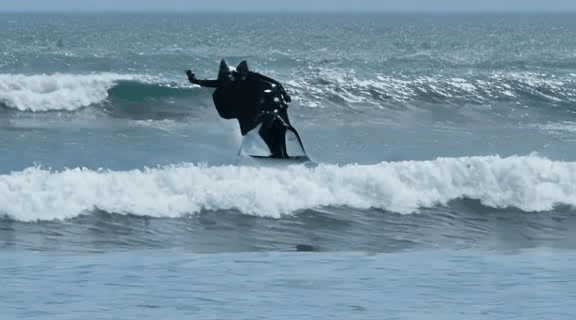

In [12]:
from IPython.display import Image
Image(filename="output1.gif")

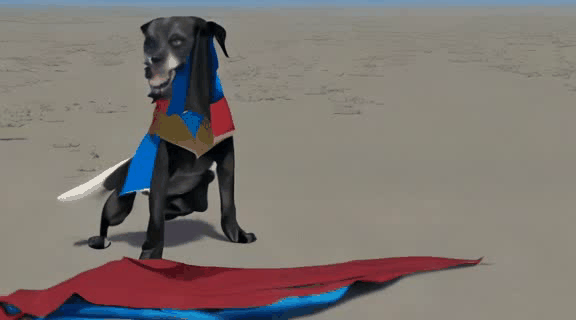

In [13]:
Image(filename="output2.gif")

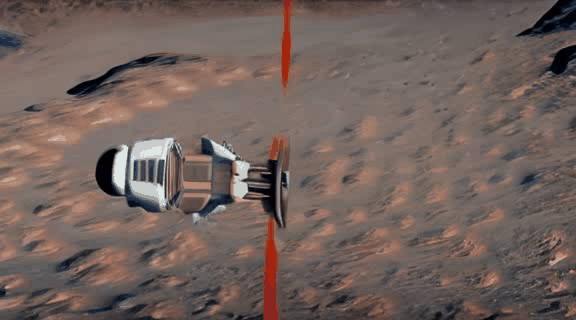

In [14]:
Image(filename="output3.gif")

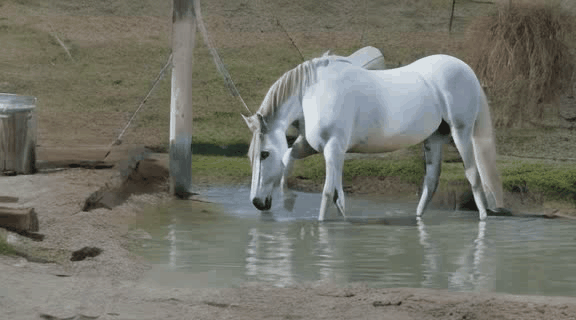

In [15]:
Image(filename="output4.gif")